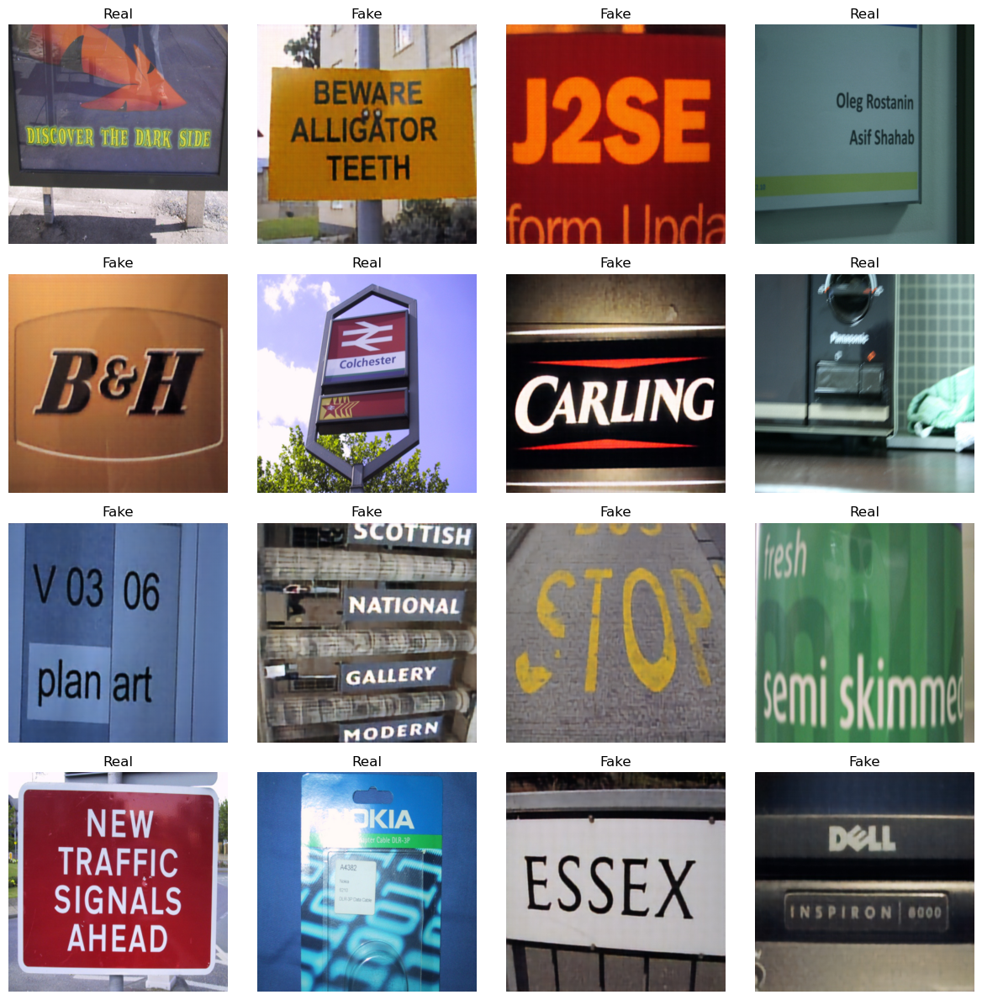

In [1]:
import os
import random
from PIL import Image
import torch
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader
import matplotlib.pyplot as plt

class RealFakeDataset(Dataset):
    def __init__(self, real_dir, fake_dir, transform=None):
        self.real_paths = [os.path.join(real_dir, f) for f in os.listdir(real_dir) if f.endswith('.jpg')]
        self.fake_paths = [os.path.join(fake_dir, f) for f in os.listdir(fake_dir) if f.endswith('.jpg')]
        self.data = [(path, 0) for path in self.real_paths] + [(path, 1) for path in self.fake_paths]
        self.transform = transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        img_path, label = self.data[idx]
        img = Image.open(img_path).convert("RGB")
        if self.transform:
            img = self.transform(img)
        return img, label

transform = transforms.Compose([
    transforms.Resize((512, 512)),
    transforms.ToTensor()
])

dataset = RealFakeDataset("ICDAR_Real", "ICDAR_Fake", transform=transform)
dataloader = DataLoader(dataset, batch_size=16, shuffle=True)

samples, labels = next(iter(dataloader))
fig, axs = plt.subplots(4, 4, figsize=(12, 12))
for i, ax in enumerate(axs.flatten()):
    ax.imshow(samples[i].permute(1, 2, 0))
    ax.set_title("Fake" if labels[i].item() == 1 else "Real")
    ax.axis("off")
plt.tight_layout()
plt.show()


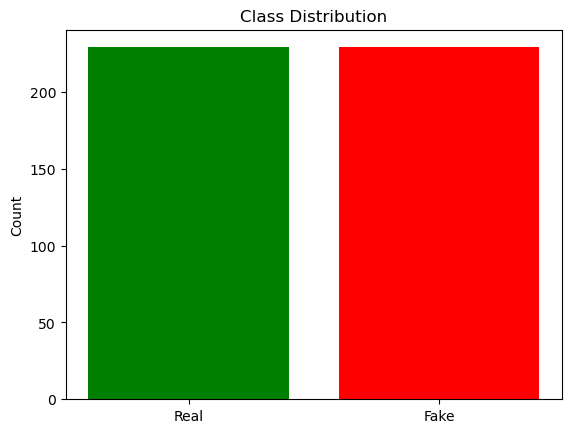

In [2]:
from collections import Counter
import matplotlib.pyplot as plt

labels = [label for _, label in dataset]
counter = Counter(labels)

plt.bar(["Real", "Fake"], [counter[0], counter[1]], color=["green", "red"])
plt.title("Class Distribution")
plt.ylabel("Count")
plt.show()


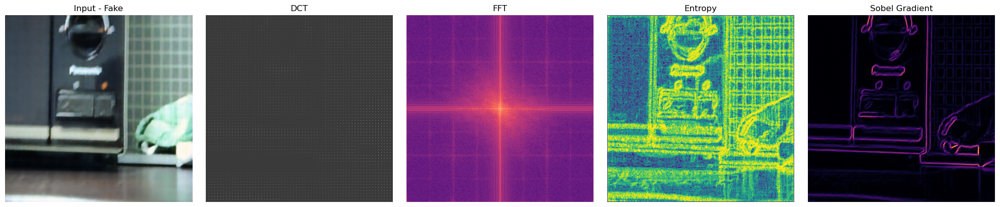

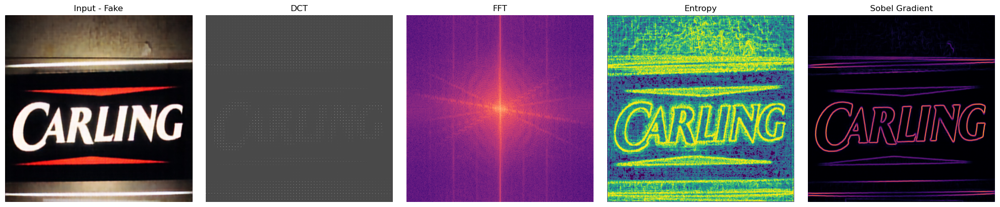

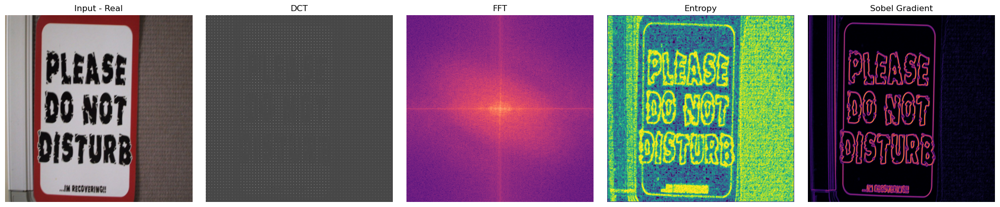

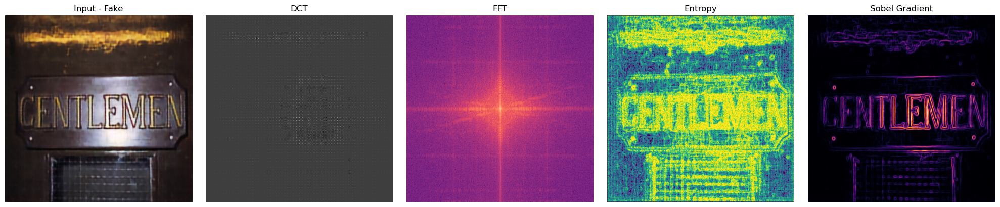

In [3]:
import os
import random
import numpy as np
from PIL import Image
from tqdm import tqdm
import matplotlib.pyplot as plt
import torch
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader, random_split
import cv2
from scipy.fftpack import dct
from scipy.stats import entropy as shannon_entropy

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# ---------- Feature Extraction Functions ----------

def extract_dct(img_tensor, block_size=8, keep_coeff=20):
    img = img_tensor.permute(1, 2, 0).cpu().numpy()
    gray = cv2.cvtColor((img * 255).astype(np.uint8), cv2.COLOR_RGB2GRAY)
    h, w = gray.shape
    dct_feats = np.zeros_like(gray, dtype=np.float32)
    for i in range(0, h - block_size + 1, block_size):
        for j in range(0, w - block_size + 1, block_size):
            block = gray[i:i+block_size, j:j+block_size]
            block_dct = dct(dct(block.T, norm='ortho').T, norm='ortho')
            dct_feats[i:i+block_size, j:j+block_size] = block_dct
    dct_norm = (dct_feats - np.min(dct_feats)) / (np.max(dct_feats) - np.min(dct_feats) + 1e-6)
    return torch.tensor(dct_norm).unsqueeze(0)

def extract_fft(img_tensor):
    img = img_tensor.permute(1, 2, 0).cpu().numpy()
    gray = cv2.cvtColor((img * 255).astype(np.uint8), cv2.COLOR_RGB2GRAY)
    f = np.fft.fft2(gray)
    fshift = np.fft.fftshift(f)
    magnitude = 20 * np.log(np.abs(fshift) + 1e-6)
    magnitude_norm = (magnitude - magnitude.min()) / (magnitude.max() - magnitude.min() + 1e-6)
    return torch.tensor(magnitude_norm).unsqueeze(0)

def extract_entropy_sobel(img_tensor):
    img = img_tensor.permute(1, 2, 0).cpu().numpy()
    gray = cv2.cvtColor((img * 255).astype(np.uint8), cv2.COLOR_RGB2GRAY)
    
    # Shannon entropy
    entropy_map = np.zeros_like(gray, dtype=np.float32)
    for i in range(1, gray.shape[0] - 1):
        for j in range(1, gray.shape[1] - 1):
            patch = gray[i-1:i+2, j-1:j+2].flatten()
            hist, _ = np.histogram(patch, bins=256, range=(0, 256), density=True)
            entropy_map[i, j] = shannon_entropy(hist + 1e-10)
    
    # Sobel
    sobelx = cv2.Sobel(gray, cv2.CV_32F, 1, 0)
    sobely = cv2.Sobel(gray, cv2.CV_32F, 0, 1)
    grad = np.sqrt(sobelx**2 + sobely**2)
    grad_norm = (grad - grad.min()) / (grad.max() - grad.min() + 1e-6)
    entropy_norm = (entropy_map - entropy_map.min()) / (entropy_map.max() - entropy_map.min() + 1e-6)

    return torch.tensor(entropy_norm).unsqueeze(0), torch.tensor(grad_norm).unsqueeze(0)

# ---------- Dataset & Visualization ----------

class RealFakeDataset(Dataset):
    def __init__(self, real_dir, fake_dir, transform=None):
        self.real_paths = [os.path.join(real_dir, f) for f in os.listdir(real_dir) if f.endswith('.jpg')]
        self.fake_paths = [os.path.join(fake_dir, f) for f in os.listdir(fake_dir) if f.endswith('.jpg')]
        self.data = [(path, 0) for path in self.real_paths] + [(path, 1) for path in self.fake_paths]
        self.transform = transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        img_path, label = self.data[idx]
        img = Image.open(img_path).convert("RGB")
        if self.transform:
            img = self.transform(img)
        return img.to(device), label

transform = transforms.Compose([
    transforms.Resize((512, 512)),
    transforms.ToTensor()
])

dataset = RealFakeDataset("ICDAR_Real", "ICDAR_Fake", transform=transform)
train_size = int(0.8 * len(dataset))
test_size = len(dataset) - train_size
train_set, test_set = random_split(dataset, [train_size, test_size])
train_loader = DataLoader(train_set, batch_size=8, shuffle=True)
test_loader = DataLoader(test_set, batch_size=8)

# ---------- Visualize Sample Features ----------

def visualize_features(samples, labels):
    for i in range(4):
        img_tensor = samples[i]
        label = labels[i]
        dct_feat = extract_dct(img_tensor).squeeze(0).cpu().numpy()
        fft_feat = extract_fft(img_tensor).squeeze(0).cpu().numpy()
        entropy_feat, grad_feat = extract_entropy_sobel(img_tensor)
        entropy_feat = entropy_feat.squeeze(0).cpu().numpy()
        grad_feat = grad_feat.squeeze(0).cpu().numpy()

        fig, axs = plt.subplots(1, 5, figsize=(20, 4))
        axs[0].imshow(img_tensor.permute(1, 2, 0).cpu())
        axs[0].set_title("Input - " + ("Fake" if label == 1 else "Real"))
        axs[1].imshow(dct_feat, cmap='gray')
        axs[1].set_title("DCT")
        axs[2].imshow(fft_feat, cmap='magma')
        axs[2].set_title("FFT")
        axs[3].imshow(entropy_feat, cmap='viridis')
        axs[3].set_title("Entropy")
        axs[4].imshow(grad_feat, cmap='inferno')
        axs[4].set_title("Sobel Gradient")
        for ax in axs:
            ax.axis("off")
        plt.tight_layout()
        plt.show()

# ---------- Run Visualization ----------

samples, labels = next(iter(train_loader))
visualize_features(samples, labels)


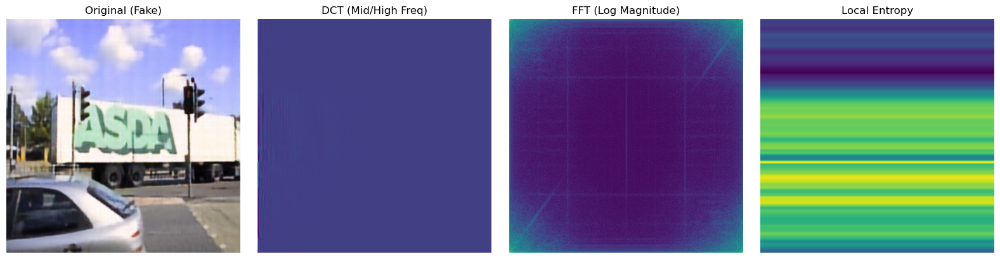

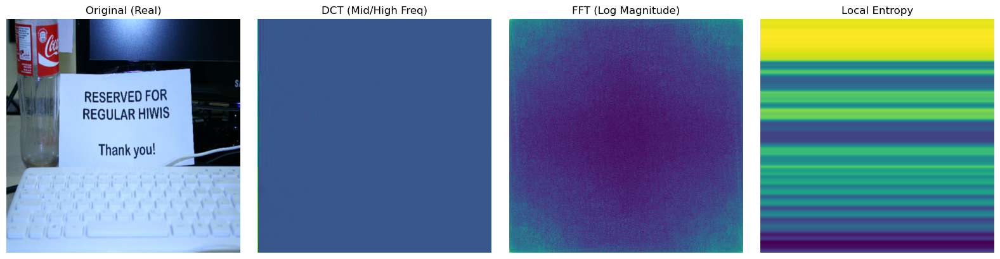

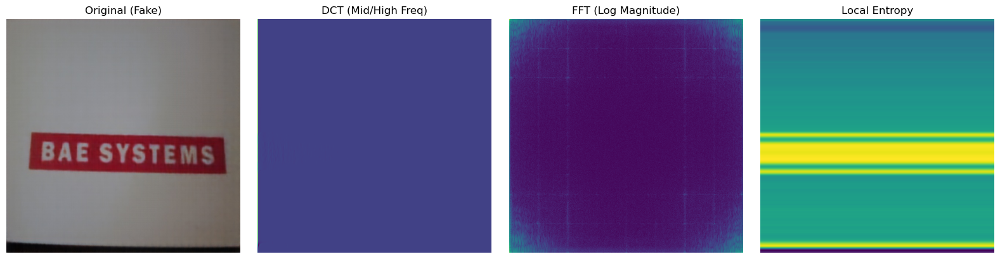

In [4]:
import os
import random
import numpy as np
from PIL import Image
import torch
import torch.nn.functional as F
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader
import matplotlib.pyplot as plt
from tqdm import tqdm
import cv2
from scipy.fftpack import dct, idct

# --- Helper Functions for Feature Extraction ---
def compute_dct_features(image, block_size=8):
    """Compute block-wise DCT features (mid/high frequencies)."""
    channels = image.shape[0]
    dct_features = []
    for c in range(channels):
        channel_dct = np.zeros_like(image[c])
        for i in range(0, image.shape[1], block_size):
            for j in range(0, image.shape[2], block_size):
                block = image[c, i:i+block_size, j:j+block_size].numpy()
                dct_block = dct(dct(block.T, norm='ortho').T, norm='ortho')
                channel_dct[i:i+block_size, j:j+block_size] = dct_block
        dct_features.append(channel_dct)
    return torch.stack([torch.from_numpy(f) for f in dct_features])

def compute_fft_features(image):
    """Compute log-magnitude of FFT (focus on radial energy)."""
    fft = torch.fft.fft2(image)
    magnitude = torch.abs(fft)
    log_magnitude = torch.log1p(magnitude)
    return log_magnitude

def compute_entropy_features(image, window_size=7):
    """Compute local Shannon entropy (sliding window)."""
    def entropy(block):
        hist = torch.histc(block, bins=256, min=0, max=1)
        prob = hist / hist.sum()
        return -torch.sum(prob * torch.log2(prob + 1e-10))
    
    channels = image.shape[0]
    entropy_features = []
    for c in range(channels):
        channel_entropy = torch.zeros_like(image[c])
        padded = F.pad(image[c], (window_size//2, window_size//2, window_size//2, window_size//2), mode='reflect')
        for i in range(image.shape[1]):
            for j in range(image.shape[2]):
                block = padded[i:i+window_size, j:j+window_size]
                channel_entropy[i, j] = entropy(block)
        entropy_features.append(channel_entropy)
    return torch.stack(entropy_features)

# --- Visualization Function ---
def visualize_features(sample, label):
    """Plot original image + DCT/FFT/Entropy features."""
    fig, axs = plt.subplots(1, 4, figsize=(16, 4))
    
    # Original Image
    axs[0].imshow(sample.permute(1, 2, 0))
    axs[0].set_title(f"Original ({'Fake' if label == 1 else 'Real'})")
    axs[0].axis('off')
    
    # DCT Features (mid-frequency)
    dct_feat = compute_dct_features(sample.unsqueeze(0))[0].mean(dim=0)
    axs[1].imshow(dct_feat, cmap='viridis')
    axs[1].set_title("DCT (Mid/High Freq)")
    axs[1].axis('off')
    
    # FFT Features (log-magnitude)
    fft_feat = compute_fft_features(sample).mean(dim=0)
    axs[2].imshow(fft_feat, cmap='viridis')
    axs[2].set_title("FFT (Log Magnitude)")
    axs[2].axis('off')
    
    # Entropy Features
    entropy_feat = compute_entropy_features(sample.unsqueeze(0))[0].mean(dim=0)
    axs[3].imshow(entropy_feat, cmap='viridis')
    axs[3].set_title("Local Entropy")
    axs[3].axis('off')
    
    plt.tight_layout()
    plt.show()

# --- Dataset & Dataloader (Your Original Code) ---
class RealFakeDataset(Dataset):
    def __init__(self, real_dir, fake_dir, transform=None):
        self.real_paths = [os.path.join(real_dir, f) for f in os.listdir(real_dir) if f.endswith('.jpg')]
        self.fake_paths = [os.path.join(fake_dir, f) for f in os.listdir(fake_dir) if f.endswith('.jpg')]
        self.data = [(path, 0) for path in self.real_paths] + [(path, 1) for path in self.fake_paths]
        self.transform = transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        img_path, label = self.data[idx]
        img = Image.open(img_path).convert("RGB")
        if self.transform:
            img = self.transform(img)
        return img, label

# --- Main Execution ---
if __name__ == "__main__":
    # Set up dataset
    transform = transforms.Compose([
        transforms.Resize((512, 512)),
        transforms.ToTensor()
    ])
    dataset = RealFakeDataset("ICDAR_Real", "ICDAR_Fake", transform=transform)
    dataloader = DataLoader(dataset, batch_size=16, shuffle=True)

    # Visualize random samples with features
    for _ in range(3):  # Show 3 random examples
        idx = random.randint(0, len(dataset)-1)
        sample, label = dataset[idx]
        visualize_features(sample, label)

Using device: cuda


Testing: 100%|██████████| 12/12 [01:03<00:00,  5.27s/it, loss=0.24, acc=92.4] 


Epoch 1:
Train Loss: 0.7523 | Train Acc: 68.03%
Test Loss: 0.2404 | Test Acc: 92.39%
--------------------------------------------------


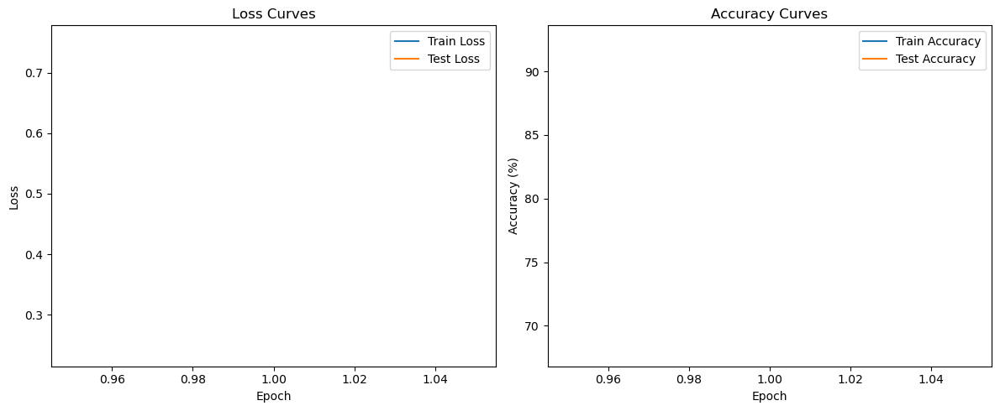

Testing: 100%|██████████| 12/12 [00:51<00:00,  4.32s/it, loss=0.164, acc=94.6]


Epoch 2:
Train Loss: 0.3597 | Train Acc: 86.61%
Test Loss: 0.1640 | Test Acc: 94.57%
--------------------------------------------------


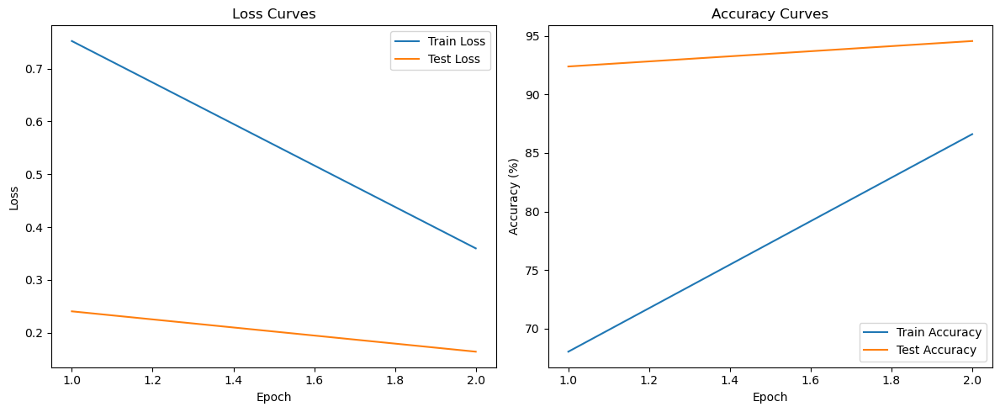

Testing: 100%|██████████| 12/12 [00:51<00:00,  4.28s/it, loss=0.0873, acc=94.6]


Epoch 3:
Train Loss: 0.3387 | Train Acc: 85.25%
Test Loss: 0.0873 | Test Acc: 94.57%
--------------------------------------------------


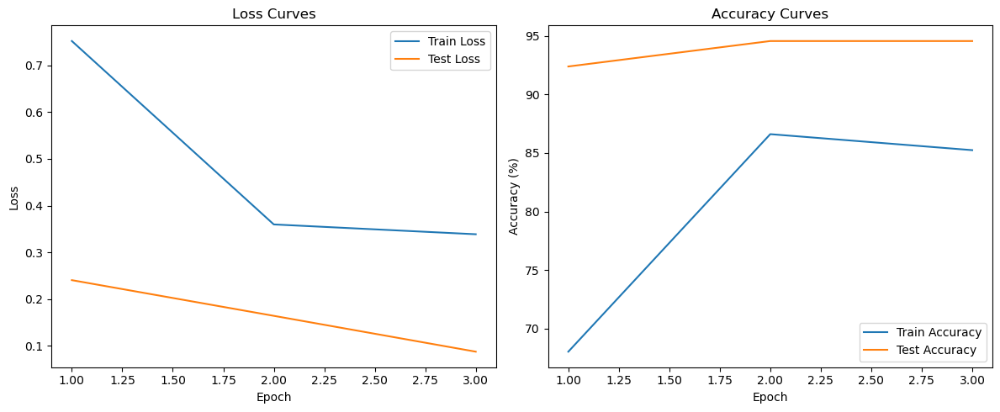

Testing: 100%|██████████| 12/12 [00:52<00:00,  4.38s/it, loss=0.0816, acc=97.8]


Epoch 4:
Train Loss: 0.1802 | Train Acc: 93.44%
Test Loss: 0.0816 | Test Acc: 97.83%
--------------------------------------------------


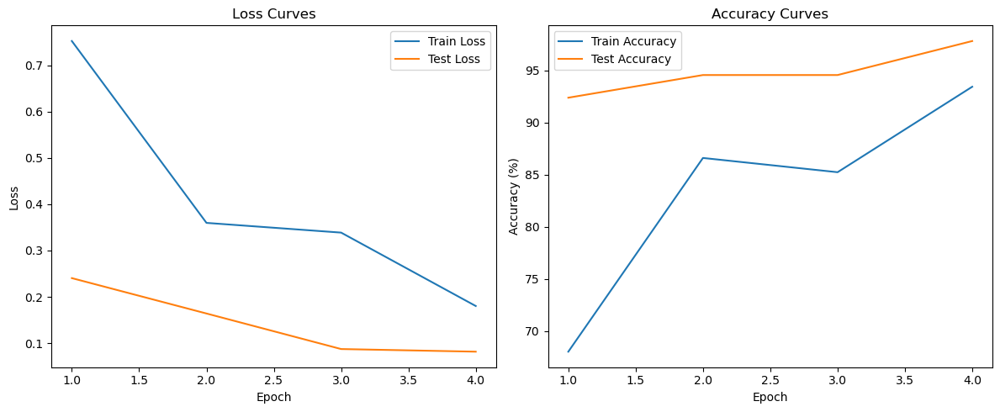

Testing: 100%|██████████| 12/12 [00:53<00:00,  4.44s/it, loss=0.225, acc=93.5]


Epoch 5:
Train Loss: 0.1744 | Train Acc: 92.90%
Test Loss: 0.2246 | Test Acc: 93.48%
--------------------------------------------------


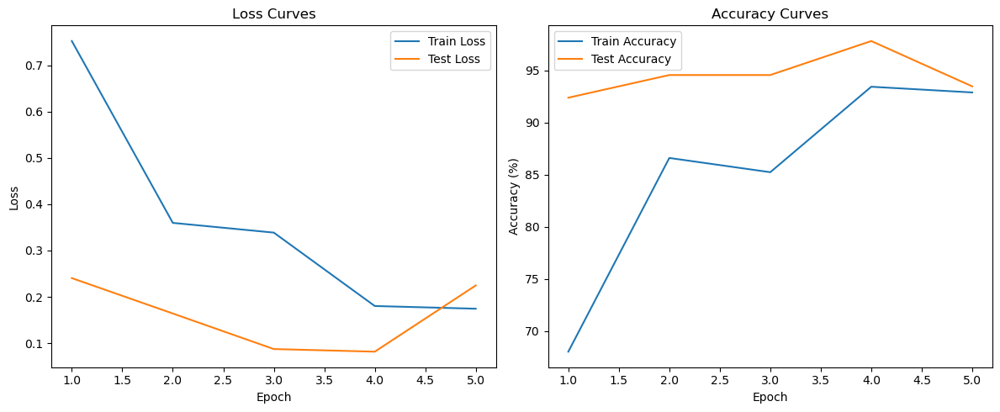

Training complete. Model saved.


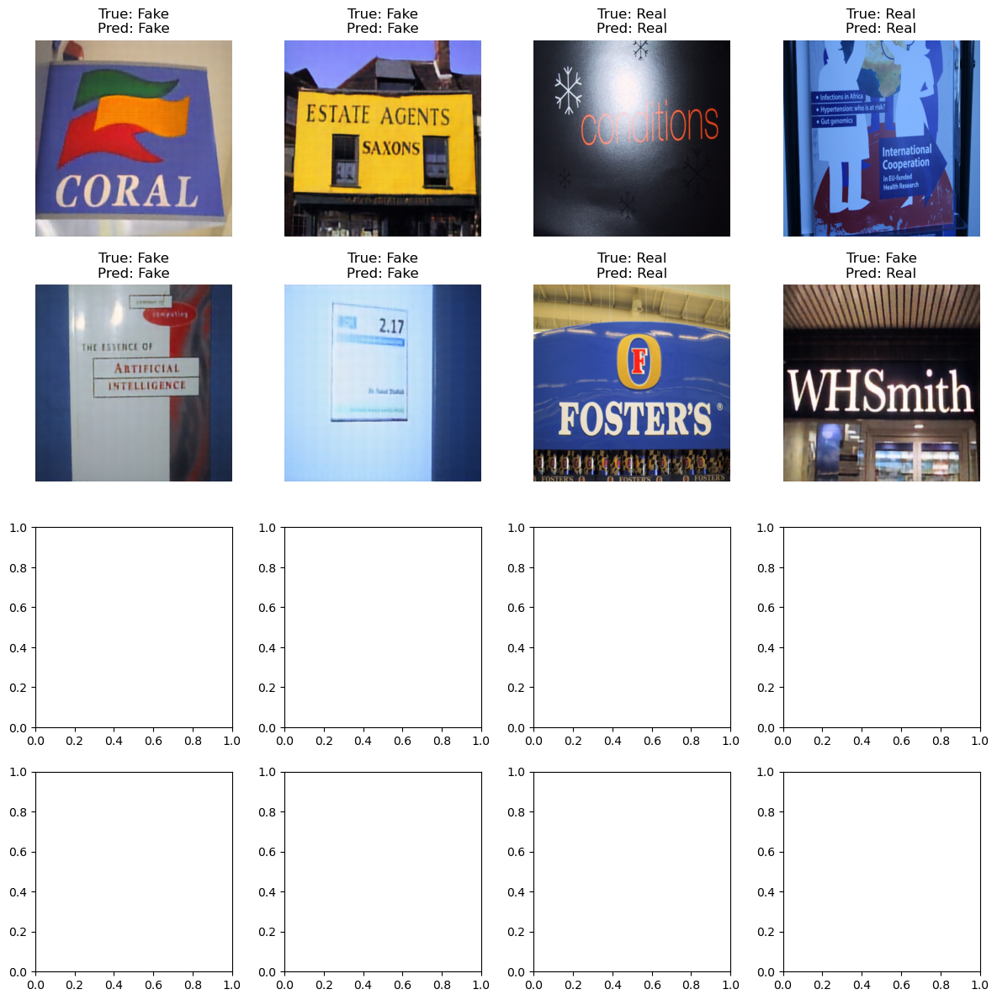

In [7]:
import os
import random
import numpy as np
from PIL import Image
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader, random_split
import matplotlib.pyplot as plt
from tqdm import tqdm
import cv2
from scipy.fftpack import dct
from tensorly.decomposition import tucker
import tensorly as tl

tl.set_backend('pytorch')

# Check if GPU is available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

class RealFakeDataset(Dataset):
    def __init__(self, real_dir, fake_dir, transform=None):
        self.real_paths = [os.path.join(real_dir, f) for f in os.listdir(real_dir) if f.endswith('.jpg')]
        self.fake_paths = [os.path.join(fake_dir, f) for f in os.listdir(fake_dir) if f.endswith('.jpg')]
        self.data = [(path, 0) for path in self.real_paths] + [(path, 1) for path in self.fake_paths]
        self.transform = transform
        
    def __len__(self):
        return len(self.data)
    
    def __getitem__(self, idx):
        img_path, label = self.data[idx]
        img = Image.open(img_path).convert("RGB")
        if self.transform:
            img = self.transform(img)
        return img, label

# Feature Extraction Functions
def extract_dct_features(image_tensor, block_size=8):
    # Convert to numpy for DCT processing
    image_np = image_tensor.cpu().numpy().transpose(1, 2, 0)  # HWC format
    image_gray = cv2.cvtColor(image_np, cv2.COLOR_RGB2GRAY)
    
    h, w = image_gray.shape
    dct_features = np.zeros((h//block_size, w//block_size, block_size*block_size))
    
    for i in range(0, h, block_size):
        if i + block_size > h:
            continue
        for j in range(0, w, block_size):
            if j + block_size > w:
                continue
            block = image_gray[i:i+block_size, j:j+block_size]
            dct_block = dct(dct(block.T, norm='ortho').T, norm='ortho')
            dct_features[i//block_size, j//block_size, :] = dct_block.flatten()
    
    # Return as tensor
    return torch.from_numpy(dct_features).float().to(device)

def extract_fft_features(image_tensor):
    # Apply FFT to each channel
    image_np = image_tensor.cpu().numpy()
    fft_features = np.zeros_like(image_np)
    
    for c in range(image_np.shape[0]):
        fft_result = np.fft.fft2(image_np[c])
        fft_shifted = np.fft.fftshift(fft_result)
        fft_magnitude = np.log(np.abs(fft_shifted) + 1)
        fft_features[c] = fft_magnitude
    
    # Downsample to match DCT feature dimensions
    h, w = fft_features.shape[1:]
    block_size = 8
    fft_features_downsampled = np.zeros((3, h//block_size, w//block_size))
    
    for c in range(3):
        for i in range(0, h, block_size):
            if i + block_size > h:
                continue
            for j in range(0, w, block_size):
                if j + block_size > w:
                    continue
                block = fft_features[c, i:i+block_size, j:j+block_size]
                fft_features_downsampled[c, i//block_size, j//block_size] = np.mean(block)
    
    return torch.from_numpy(fft_features_downsampled).float().to(device)

def extract_entropy_features(image_tensor, window_size=8):
    # Convert to numpy for entropy calculation
    image_np = image_tensor.cpu().numpy().transpose(1, 2, 0)  # HWC format
    image_gray = cv2.cvtColor(image_np, cv2.COLOR_RGB2GRAY)
    
    h, w = image_gray.shape
    entropy_features = np.zeros((h//window_size, w//window_size))
    
    for i in range(0, h, window_size):
        if i + window_size > h:
            continue
        for j in range(0, w, window_size):
            if j + window_size > w:
                continue
            window = image_gray[i:i+window_size, j:j+window_size]
            
            # Calculate entropy
            hist = cv2.calcHist([window], [0], None, [256], [0, 256])
            hist = hist / (window_size * window_size)
            non_zero_hist = hist[hist > 0]
            entropy = -np.sum(non_zero_hist * np.log2(non_zero_hist))
            
            entropy_features[i//window_size, j//window_size] = entropy
    
    # Return as tensor
    return torch.from_numpy(entropy_features).unsqueeze(0).float().to(device)

class TuckerDecompositionLayer(nn.Module):
    def __init__(self, input_dims, rank):
        super(TuckerDecompositionLayer, self).__init__()
        self.rank = rank
        self.input_dims = input_dims
        
        # Initialize factor matrices as learnable parameters
        self.U1 = nn.Parameter(torch.randn(input_dims[0], rank[0]))
        self.U2 = nn.Parameter(torch.randn(input_dims[1], rank[1]))
        self.U3 = nn.Parameter(torch.randn(input_dims[2], rank[2]))
        
        # Initialize core tensor
        self.core_tensor = nn.Parameter(torch.randn(rank))
        
    def forward(self, tensor):
        batch_size = tensor.shape[0]
        results = []
        
        # Apply tucker decomposition for each sample in batch
        for i in range(batch_size):
            # Mode-1 product
            tmp = torch.tensordot(self.core_tensor, self.U1, dims=([0], [1]))
            # Mode-2 product
            tmp = torch.tensordot(tmp, self.U2, dims=([0], [1]))
            # Mode-3 product
            tmp = torch.tensordot(tmp, self.U3, dims=([0], [1]))
            
            results.append(tmp)
        
        return torch.stack(results)

class SelfAttentionGating(nn.Module):
    def __init__(self, feature_dim):
        super(SelfAttentionGating, self).__init__()
        self.query_conv = nn.Conv2d(feature_dim, feature_dim // 8, kernel_size=1)
        self.key_conv = nn.Conv2d(feature_dim, feature_dim // 8, kernel_size=1)
        self.value_conv = nn.Conv2d(feature_dim, feature_dim, kernel_size=1)
        self.gamma = nn.Parameter(torch.zeros(1))
        
    def forward(self, x):
        batch_size, C, H, W = x.size()
        
        # Reshape for attention computation
        query = self.query_conv(x).view(batch_size, -1, H * W).permute(0, 2, 1)  # B x (H*W) x C'
        key = self.key_conv(x).view(batch_size, -1, H * W)  # B x C' x (H*W)
        value = self.value_conv(x).view(batch_size, -1, H * W)  # B x C x (H*W)
        
        # Compute attention scores
        attention = F.softmax(torch.bmm(query, key), dim=2)  # B x (H*W) x (H*W)
        
        # Apply attention to values
        out = torch.bmm(value, attention.permute(0, 2, 1))
        out = out.view(batch_size, C, H, W)
        
        # Residual connection
        out = self.gamma * out + x
        
        return out

class MultiDomainFeatureFusionModel(nn.Module):
    def __init__(self):
        super(MultiDomainFeatureFusionModel, self).__init__()
        
        # Define dimensions for feature tensor
        self.spatial_dim = 64  # 512/8 = 64
        self.feature_channels = 66  # 64 (DCT) + 1 (entropy) + 1 (FFT mean)
        
        # Tucker decomposition layer
        self.tucker_rank = (32, 32, 33)  # Reduced rank for each dimension
        self.tucker_layer = TuckerDecompositionLayer(
            input_dims=(self.spatial_dim, self.spatial_dim, self.feature_channels),
            rank=self.tucker_rank
        )
        
        # Fusion convolutional layers to process the combined features
        self.conv1 = nn.Conv2d(self.feature_channels, 64, kernel_size=3, padding=1)
        self.bn1 = nn.BatchNorm2d(64)
        
        # Self-attention gating
        self.attention = SelfAttentionGating(64)
        
        # Classification layers
        self.conv2 = nn.Conv2d(64, 128, kernel_size=3, padding=1, stride=2)
        self.bn2 = nn.BatchNorm2d(128)
        self.conv3 = nn.Conv2d(128, 256, kernel_size=3, padding=1, stride=2)
        self.bn3 = nn.BatchNorm2d(256)
        self.conv4 = nn.Conv2d(256, 512, kernel_size=3, padding=1, stride=2)
        self.bn4 = nn.BatchNorm2d(512)
        
        # Unique twist: Multi-scale feature aggregation
        self.global_pool = nn.AdaptiveAvgPool2d(1)
        self.local_pool = nn.AdaptiveAvgPool2d(4)
        self.local_conv = nn.Conv2d(512, 128, kernel_size=1)
        
        # Final classification
        self.fc_global = nn.Linear(512, 256)
        self.fc_local = nn.Linear(128 * 4 * 4, 256)
        self.fc_final = nn.Linear(512, 2)
        
        self.dropout = nn.Dropout(0.5)
        
    def forward(self, x):
        batch_size = x.size(0)
        
        # Extract features for each image in the batch
        all_features = []
        for i in range(batch_size):
            img = x[i]
            
            # Extract DCT features
            dct_features = extract_dct_features(img)
            
            # Extract FFT features
            fft_features = extract_fft_features(img)
            
            # Extract entropy features
            entropy_features = extract_entropy_features(img)
            
            # Prepare feature dimensions to match
            h, w = dct_features.shape[0], dct_features.shape[1]
            dct_reshape = dct_features.view(h, w, -1)
            
            # Average FFT features over channels to match spatial dimensions
            fft_mean = torch.mean(fft_features, dim=0).unsqueeze(-1)
            
            # Stack features along the channel dimension
            entropy_reshape = entropy_features.squeeze(0).unsqueeze(-1)
            
            # Concatenate features for tensorization
            stacked_features = torch.cat([dct_reshape, entropy_reshape, fft_mean], dim=-1)
            all_features.append(stacked_features)
        
        # Stack batch
        feature_tensor = torch.stack(all_features).to(device)
        
        # Apply Tucker decomposition with learned parameters
        compressed_tensor = self.tucker_layer(feature_tensor)
        
        # Differentiable feature binding (Hadamard product)
        fused_features = feature_tensor * compressed_tensor
        
        # Reshape for convolution (B, H, W, C) -> (B, C, H, W)
        fused_features = fused_features.permute(0, 3, 1, 2)
        
        # Apply convolutional layers
        x = F.relu(self.bn1(self.conv1(fused_features)))
        
        # Apply attention gating
        x = self.attention(x)
        
        # Deeper feature extraction
        x = F.relu(self.bn2(self.conv2(x)))
        x = F.relu(self.bn3(self.conv3(x)))
        x = F.relu(self.bn4(self.conv4(x)))
        
        # Multi-scale feature aggregation
        global_features = self.global_pool(x).view(batch_size, -1)
        local_features = self.local_pool(x)
        local_features = self.local_conv(local_features)
        local_features = local_features.view(batch_size, -1)
        
        # Final classification
        global_features = self.fc_global(global_features)
        local_features = self.fc_local(local_features)
        
        combined_features = torch.cat([global_features, local_features], dim=1)
        combined_features = self.dropout(combined_features)
        
        logits = self.fc_final(combined_features)
        
        return logits

# Data preparation
transform = transforms.Compose([
    transforms.Resize((512, 512)),
    transforms.ToTensor()
])

# Load dataset
dataset = RealFakeDataset("ICDAR_Real", "ICDAR_Fake", transform=transform)

# Split dataset into train and test sets (80% train, 20% test)
train_size = int(0.8 * len(dataset))
test_size = len(dataset) - train_size
train_dataset, test_dataset = random_split(dataset, [train_size, test_size])

# Create data loaders
train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=8, shuffle=False)

# Initialize model, loss function, and optimizer
model = MultiDomainFeatureFusionModel().to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', patience=3, factor=0.5)

# Training function
def train(epoch):
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0
    
    progress_bar = tqdm(train_loader, desc=f'Epoch {epoch}')
    for batch_idx, (inputs, targets) in enumerate(progress_bar):
        inputs, targets = inputs.to(device), targets.to(device)
        
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, targets)
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item()
        _, predicted = outputs.max(1)
        total += targets.size(0)
        correct += predicted.eq(targets).sum().item()
        
        progress_bar.set_postfix({
            'loss': running_loss / (batch_idx + 1),
            'acc': 100. * correct / total
        })
    
    train_loss = running_loss / len(train_loader)
    train_acc = 100. * correct / total
    return train_loss, train_acc

# Testing function
def test(epoch):
    model.eval()
    running_loss = 0.0
    correct = 0
    total = 0
    
    with torch.no_grad():
        progress_bar = tqdm(test_loader, desc='Testing')
        for batch_idx, (inputs, targets) in enumerate(progress_bar):
            inputs, targets = inputs.to(device), targets.to(device)
            
            outputs = model(inputs)
            loss = criterion(outputs, targets)
            
            running_loss += loss.item()
            _, predicted = outputs.max(1)
            total += targets.size(0)
            correct += predicted.eq(targets).sum().item()
            
            progress_bar.set_postfix({
                'loss': running_loss / (batch_idx + 1),
                'acc': 100. * correct / total
            })
    
    test_loss = running_loss / len(test_loader)
    test_acc = 100. * correct / total
    
    # Adjust learning rate
    scheduler.step(test_loss)
    
    return test_loss, test_acc

# Training loop
num_epochs = 5
train_losses = []
test_losses = []
train_accs = []
test_accs = []

for epoch in range(1, num_epochs + 1):
    train_loss, train_acc = train(epoch)
    test_loss, test_acc = test(epoch)
    
    train_losses.append(train_loss)
    test_losses.append(test_loss)
    train_accs.append(train_acc)
    test_accs.append(test_acc)
    
    # Print every 10 epochs
    if epoch % 1 == 0:
        print(f'Epoch {epoch}:')
        print(f'Train Loss: {train_loss:.4f} | Train Acc: {train_acc:.2f}%')
        print(f'Test Loss: {test_loss:.4f} | Test Acc: {test_acc:.2f}%')
        print('-' * 50)
        
        # Plot loss and accuracy curves
        plt.figure(figsize=(12, 5))
        
        plt.subplot(1, 2, 1)
        plt.plot(range(1, epoch + 1), train_losses, label='Train Loss')
        plt.plot(range(1, epoch + 1), test_losses, label='Test Loss')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.legend()
        plt.title('Loss Curves')
        
        plt.subplot(1, 2, 2)
        plt.plot(range(1, epoch + 1), train_accs, label='Train Accuracy')
        plt.plot(range(1, epoch + 1), test_accs, label='Test Accuracy')
        plt.xlabel('Epoch')
        plt.ylabel('Accuracy (%)')
        plt.legend()
        plt.title('Accuracy Curves')
        
        plt.tight_layout()
        plt.show()

# Save the model
torch.save(model.state_dict(), 'real_fake_fusion_model.pth')
print("Training complete. Model saved.")

# Visualize some predictions
def visualize_predictions():
    model.eval()
    images, labels = next(iter(test_loader))
    images, labels = images.to(device), labels.to(device)
    
    with torch.no_grad():
        outputs = model(images)
        _, predicted = outputs.max(1)
    
    # Convert to CPU for plotting
    images = images.cpu()
    labels = labels.cpu()
    predicted = predicted.cpu()
    
    fig, axs = plt.subplots(4, 4, figsize=(12, 12))
    for i, ax in enumerate(axs.flatten()):
        if i < len(images):
            ax.imshow(images[i].permute(1, 2, 0))
            ax.set_title(f"True: {'Fake' if labels[i].item() == 1 else 'Real'}\nPred: {'Fake' if predicted[i].item() == 1 else 'Real'}")
            ax.axis("off")
    
    plt.tight_layout()
    plt.show()

# Call visualization function
visualize_predictions()

In [1]:
import os
import random
import numpy as np
from PIL import Image
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader, random_split
import matplotlib.pyplot as plt
from tqdm import tqdm
import cv2
from scipy.fftpack import dct
from tensorly.decomposition import tucker
import tensorly as tl

tl.set_backend('pytorch')

# Check if GPU is available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

class RealFakeDataset(Dataset):
    def __init__(self, real_dir, fake_dir, transform=None):
        self.real_paths = [os.path.join(real_dir, f) for f in os.listdir(real_dir) if f.endswith('.jpg')]
        self.fake_paths = [os.path.join(fake_dir, f) for f in os.listdir(fake_dir) if f.endswith('.jpg')]
        self.data = [(path, 0) for path in self.real_paths] + [(path, 1) for path in self.fake_paths]
        self.transform = transform
        
    def __len__(self):
        return len(self.data)
    
    def __getitem__(self, idx):
        img_path, label = self.data[idx]
        img = Image.open(img_path).convert("RGB")
        if self.transform:
            img = self.transform(img)
        return img, label

# Feature Extraction Functions
def extract_dct_features(image_tensor, block_size=8):
    # Convert to numpy for DCT processing
    image_np = image_tensor.cpu().numpy().transpose(1, 2, 0)  # HWC format
    image_gray = cv2.cvtColor(image_np, cv2.COLOR_RGB2GRAY)
    
    h, w = image_gray.shape
    dct_features = np.zeros((h//block_size, w//block_size, block_size*block_size))
    
    for i in range(0, h, block_size):
        if i + block_size > h:
            continue
        for j in range(0, w, block_size):
            if j + block_size > w:
                continue
            block = image_gray[i:i+block_size, j:j+block_size]
            dct_block = dct(dct(block.T, norm='ortho').T, norm='ortho')
            dct_features[i//block_size, j//block_size, :] = dct_block.flatten()
    
    # Return as tensor
    return torch.from_numpy(dct_features).float().to(device)

def extract_fft_features(image_tensor):
    # Apply FFT to each channel
    image_np = image_tensor.cpu().numpy()
    fft_features = np.zeros_like(image_np)
    
    for c in range(image_np.shape[0]):
        fft_result = np.fft.fft2(image_np[c])
        fft_shifted = np.fft.fftshift(fft_result)
        fft_magnitude = np.log(np.abs(fft_shifted) + 1)
        fft_features[c] = fft_magnitude
    
    # Downsample to match DCT feature dimensions
    h, w = fft_features.shape[1:]
    block_size = 8
    fft_features_downsampled = np.zeros((3, h//block_size, w//block_size))
    
    for c in range(3):
        for i in range(0, h, block_size):
            if i + block_size > h:
                continue
            for j in range(0, w, block_size):
                if j + block_size > w:
                    continue
                block = fft_features[c, i:i+block_size, j:j+block_size]
                fft_features_downsampled[c, i//block_size, j//block_size] = np.mean(block)
    
    return torch.from_numpy(fft_features_downsampled).float().to(device)

def extract_entropy_features(image_tensor, window_size=8):
    # Convert to numpy for entropy calculation
    image_np = image_tensor.cpu().numpy().transpose(1, 2, 0)  # HWC format
    image_gray = cv2.cvtColor(image_np, cv2.COLOR_RGB2GRAY)
    
    h, w = image_gray.shape
    entropy_features = np.zeros((h//window_size, w//window_size))
    
    for i in range(0, h, window_size):
        if i + window_size > h:
            continue
        for j in range(0, w, window_size):
            if j + window_size > w:
                continue
            window = image_gray[i:i+window_size, j:j+window_size]
            
            # Calculate entropy
            hist = cv2.calcHist([window], [0], None, [256], [0, 256])
            hist = hist / (window_size * window_size)
            non_zero_hist = hist[hist > 0]
            entropy = -np.sum(non_zero_hist * np.log2(non_zero_hist))
            
            entropy_features[i//window_size, j//window_size] = entropy
    
    # Return as tensor
    return torch.from_numpy(entropy_features).unsqueeze(0).float().to(device)

class TuckerDecompositionLayer(nn.Module):
    def __init__(self, input_dims, rank):
        super(TuckerDecompositionLayer, self).__init__()
        self.rank = rank
        self.input_dims = input_dims
        
        # Initialize factor matrices as learnable parameters
        self.U1 = nn.Parameter(torch.randn(input_dims[0], rank[0]))
        self.U2 = nn.Parameter(torch.randn(input_dims[1], rank[1]))
        self.U3 = nn.Parameter(torch.randn(input_dims[2], rank[2]))
        
        # Initialize core tensor
        self.core_tensor = nn.Parameter(torch.randn(rank))
        
    def forward(self, tensor):
        batch_size = tensor.shape[0]
        results = []
        
        # Apply tucker decomposition for each sample in batch
        for i in range(batch_size):
            # Mode-1 product
            tmp = torch.tensordot(self.core_tensor, self.U1, dims=([0], [1]))
            # Mode-2 product
            tmp = torch.tensordot(tmp, self.U2, dims=([0], [1]))
            # Mode-3 product
            tmp = torch.tensordot(tmp, self.U3, dims=([0], [1]))
            
            results.append(tmp)
        
        return torch.stack(results)

class SelfAttentionGating(nn.Module):
    def __init__(self, feature_dim):
        super(SelfAttentionGating, self).__init__()
        self.query_conv = nn.Conv2d(feature_dim, feature_dim // 8, kernel_size=1)
        self.key_conv = nn.Conv2d(feature_dim, feature_dim // 8, kernel_size=1)
        self.value_conv = nn.Conv2d(feature_dim, feature_dim, kernel_size=1)
        self.gamma = nn.Parameter(torch.zeros(1))
        
    def forward(self, x):
        batch_size, C, H, W = x.size()
        
        # Reshape for attention computation
        query = self.query_conv(x).view(batch_size, -1, H * W).permute(0, 2, 1)  # B x (H*W) x C'
        key = self.key_conv(x).view(batch_size, -1, H * W)  # B x C' x (H*W)
        value = self.value_conv(x).view(batch_size, -1, H * W)  # B x C x (H*W)
        
        # Compute attention scores
        attention = F.softmax(torch.bmm(query, key), dim=2)  # B x (H*W) x (H*W)
        
        # Apply attention to values
        out = torch.bmm(value, attention.permute(0, 2, 1))
        out = out.view(batch_size, C, H, W)
        
        # Residual connection
        out = self.gamma * out + x
        
        return out

class MultiDomainFeatureFusionModel(nn.Module):
    def __init__(self):
        super(MultiDomainFeatureFusionModel, self).__init__()
        
        # Define dimensions for feature tensor
        self.spatial_dim = 64  # 512/8 = 64
        self.feature_channels = 66  # 64 (DCT) + 1 (entropy) + 1 (FFT mean)
        
        # Tucker decomposition layer
        self.tucker_rank = (32, 32, 33)  # Reduced rank for each dimension
        self.tucker_layer = TuckerDecompositionLayer(
            input_dims=(self.spatial_dim, self.spatial_dim, self.feature_channels),
            rank=self.tucker_rank
        )
        
        # Fusion convolutional layers to process the combined features
        self.conv1 = nn.Conv2d(self.feature_channels, 64, kernel_size=3, padding=1)
        self.bn1 = nn.BatchNorm2d(64)
        
        # Self-attention gating
        self.attention = SelfAttentionGating(64)
        
        # Classification layers
        self.conv2 = nn.Conv2d(64, 128, kernel_size=3, padding=1, stride=2)
        self.bn2 = nn.BatchNorm2d(128)
        self.conv3 = nn.Conv2d(128, 256, kernel_size=3, padding=1, stride=2)
        self.bn3 = nn.BatchNorm2d(256)
        self.conv4 = nn.Conv2d(256, 512, kernel_size=3, padding=1, stride=2)
        self.bn4 = nn.BatchNorm2d(512)
        
        # Unique twist: Multi-scale feature aggregation
        self.global_pool = nn.AdaptiveAvgPool2d(1)
        self.local_pool = nn.AdaptiveAvgPool2d(4)
        self.local_conv = nn.Conv2d(512, 128, kernel_size=1)
        
        # Final classification
        self.fc_global = nn.Linear(512, 256)
        self.fc_local = nn.Linear(128 * 4 * 4, 256)
        self.fc_final = nn.Linear(512, 2)
        
        self.dropout = nn.Dropout(0.5)
        
    def forward(self, x):
        batch_size = x.size(0)
        
        # Extract features for each image in the batch
        all_features = []
        for i in range(batch_size):
            img = x[i]
            
            # Extract DCT features
            dct_features = extract_dct_features(img)
            
            # Extract FFT features
            fft_features = extract_fft_features(img)
            
            # Extract entropy features
            entropy_features = extract_entropy_features(img)
            
            # Prepare feature dimensions to match
            h, w = dct_features.shape[0], dct_features.shape[1]
            dct_reshape = dct_features.view(h, w, -1)
            
            # Average FFT features over channels to match spatial dimensions
            fft_mean = torch.mean(fft_features, dim=0).unsqueeze(-1)
            
            # Stack features along the channel dimension
            entropy_reshape = entropy_features.squeeze(0).unsqueeze(-1)
            
            # Concatenate features for tensorization
            stacked_features = torch.cat([dct_reshape, entropy_reshape, fft_mean], dim=-1)
            all_features.append(stacked_features)
        
        # Stack batch
        feature_tensor = torch.stack(all_features).to(device)
        
        # Apply Tucker decomposition with learned parameters
        compressed_tensor = self.tucker_layer(feature_tensor)
        
        # Differentiable feature binding (Hadamard product)
        fused_features = feature_tensor * compressed_tensor
        
        # Reshape for convolution (B, H, W, C) -> (B, C, H, W)
        fused_features = fused_features.permute(0, 3, 1, 2)
        
        # Apply convolutional layers
        x = F.relu(self.bn1(self.conv1(fused_features)))
        
        # Apply attention gating
        x = self.attention(x)
        
        # Deeper feature extraction
        x = F.relu(self.bn2(self.conv2(x)))
        x = F.relu(self.bn3(self.conv3(x)))
        x = F.relu(self.bn4(self.conv4(x)))
        
        # Multi-scale feature aggregation
        global_features = self.global_pool(x).view(batch_size, -1)
        local_features = self.local_pool(x)
        local_features = self.local_conv(local_features)
        local_features = local_features.view(batch_size, -1)
        
        # Final classification
        global_features = self.fc_global(global_features)
        local_features = self.fc_local(local_features)
        
        combined_features = torch.cat([global_features, local_features], dim=1)
        combined_features = self.dropout(combined_features)
        
        logits = self.fc_final(combined_features)
        
        return logits

# Data preparation
transform = transforms.Compose([
    transforms.Resize((512, 512)),
    transforms.ToTensor()
])

# Load dataset
dataset = RealFakeDataset("ICDAR_Real", "ICDAR_Fake", transform=transform)

# Split dataset into train and test sets (80% train, 20% test)
train_size = int(0.8 * len(dataset))
test_size = len(dataset) - train_size
train_dataset, test_dataset = random_split(dataset, [train_size, test_size])

# Create data loaders
train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=8, shuffle=False)

# Initialize model, loss function, and optimizer
model = MultiDomainFeatureFusionModel().to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', patience=3, factor=0.5)

Using device: cuda


Evaluating train dataset:


Evaluating: 100%|██████████| 46/46 [03:27<00:00,  4.52s/it]


Evaluating test dataset:


Evaluating: 100%|██████████| 12/12 [00:50<00:00,  4.17s/it]



Classification Report (Training Set):
              precision    recall  f1-score   support

        Real       0.93      0.99      0.96       185
        Fake       0.99      0.93      0.96       181

    accuracy                           0.96       366
   macro avg       0.96      0.96      0.96       366
weighted avg       0.96      0.96      0.96       366


Classification Report (Test Set):
              precision    recall  f1-score   support

        Real       0.92      1.00      0.96        44
        Fake       1.00      0.92      0.96        48

    accuracy                           0.96        92
   macro avg       0.96      0.96      0.96        92
weighted avg       0.96      0.96      0.96        92



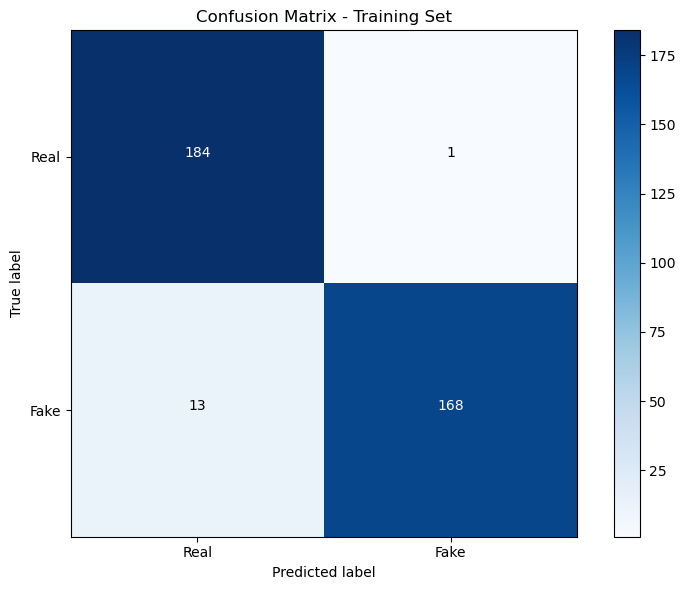

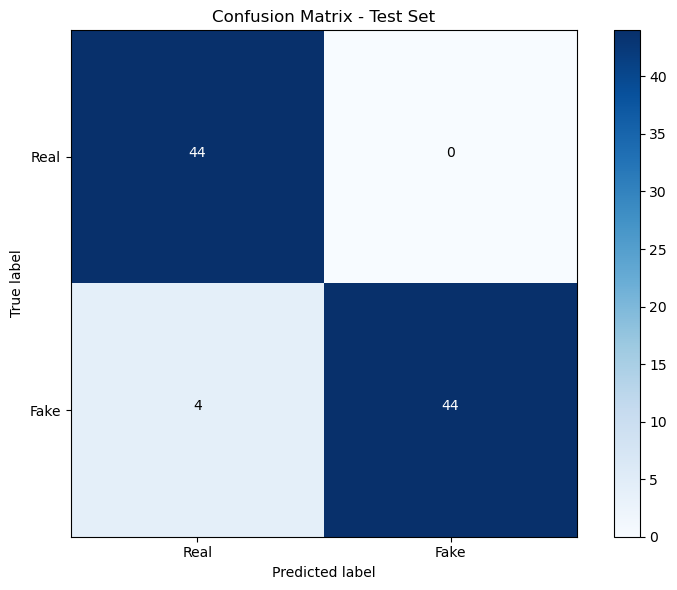

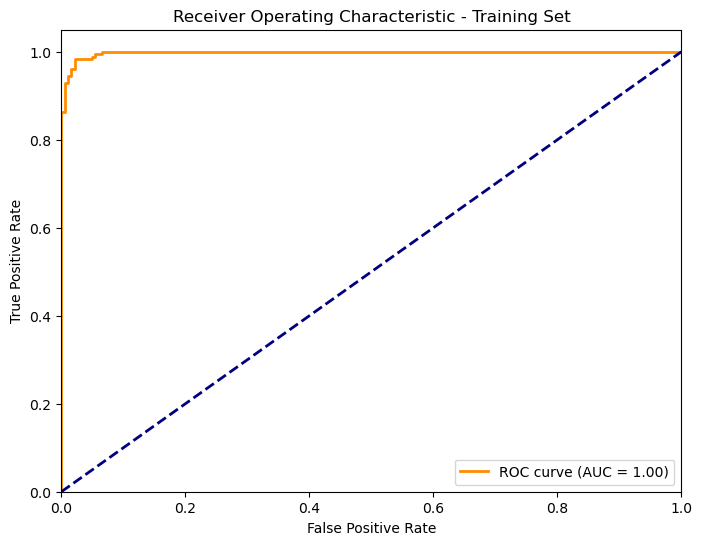

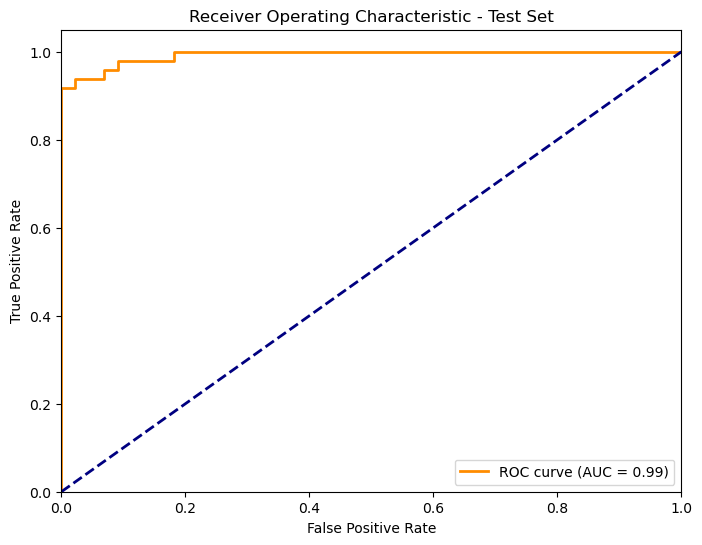

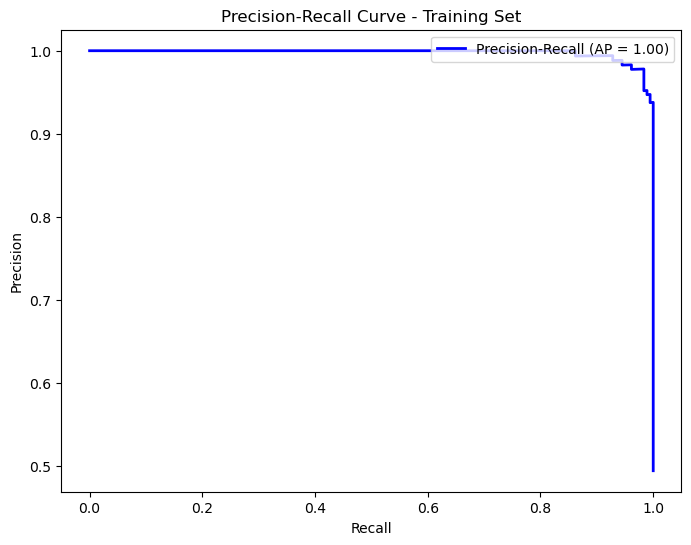

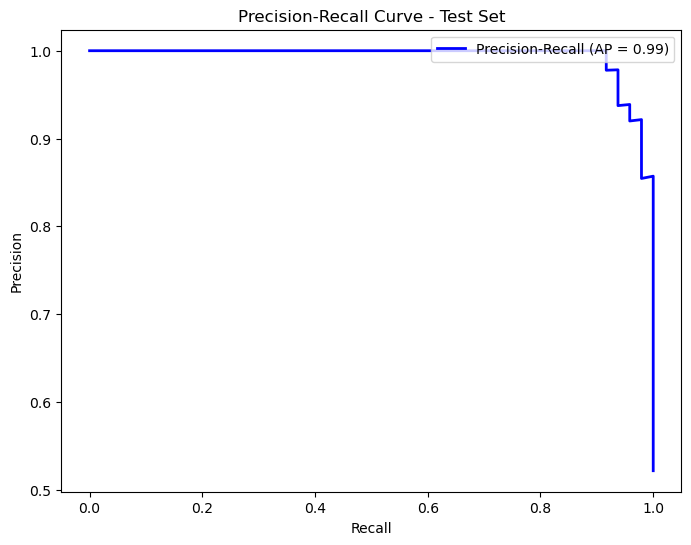


Advanced Metrics (Training Set):
                      Value
Accuracy           0.961749
Balanced Accuracy  0.961386
Precision          0.994083
Recall             0.928177
F1 Score           0.960000
MCC                0.925428
Cohen's Kappa      0.923433
Log Loss           0.176850
ROC AUC            0.997790
PR AUC             0.997731

Advanced Metrics (Test Set):
                      Value
Accuracy           0.956522
Balanced Accuracy  0.958333
Precision          1.000000
Recall             0.916667
F1 Score           0.956522
MCC                0.916667
Cohen's Kappa      0.913208
Log Loss           0.225424
ROC AUC            0.992424
PR AUC             0.993661

Class-wise Metrics (Training Set):
  Class   TP  FP   TN  FN  Sensitivity  Specificity       PPV       NPV
0  Real  184   1  168  13     0.994595     0.928177  0.934010  0.928177
1  Fake  168  13  184   1     0.928177     0.994595  0.994083  0.994595

Class-wise Metrics (Test Set):
  Class  TP  FP  TN  FN  Sensitivity

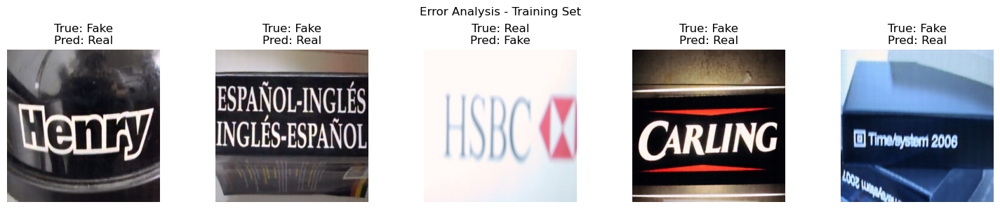


Error Analysis (Test Set):


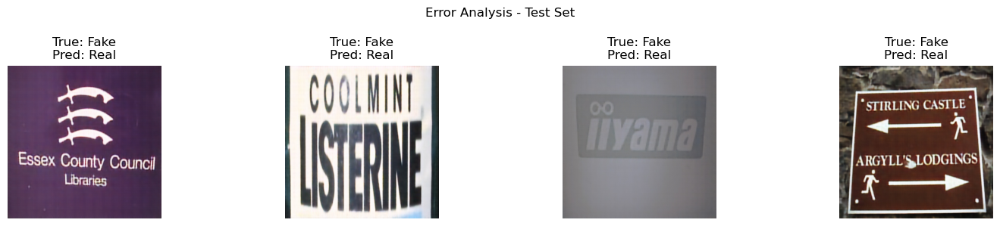


Threshold Analysis (Training Set):


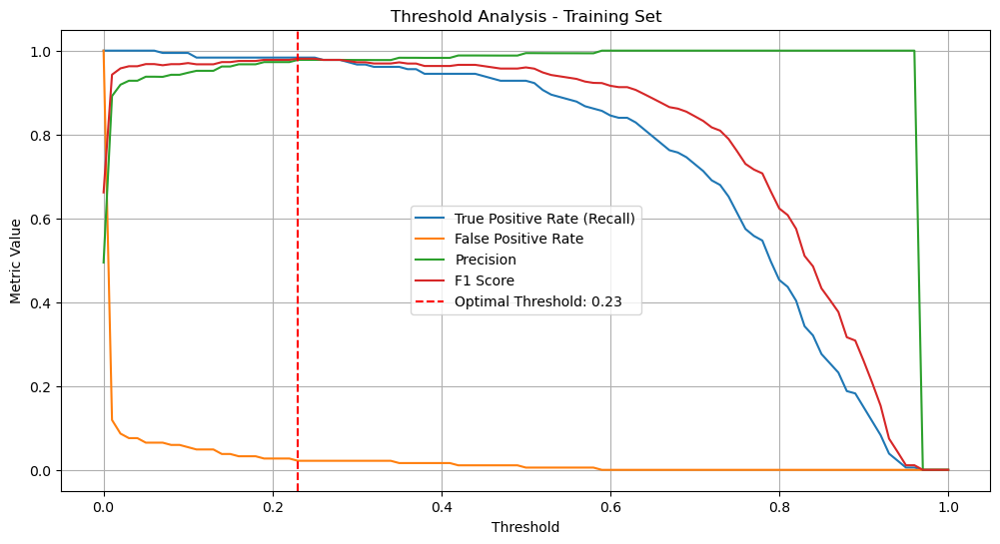

Optimal Decision Threshold (Training Set): 0.2300

Threshold Analysis (Test Set):


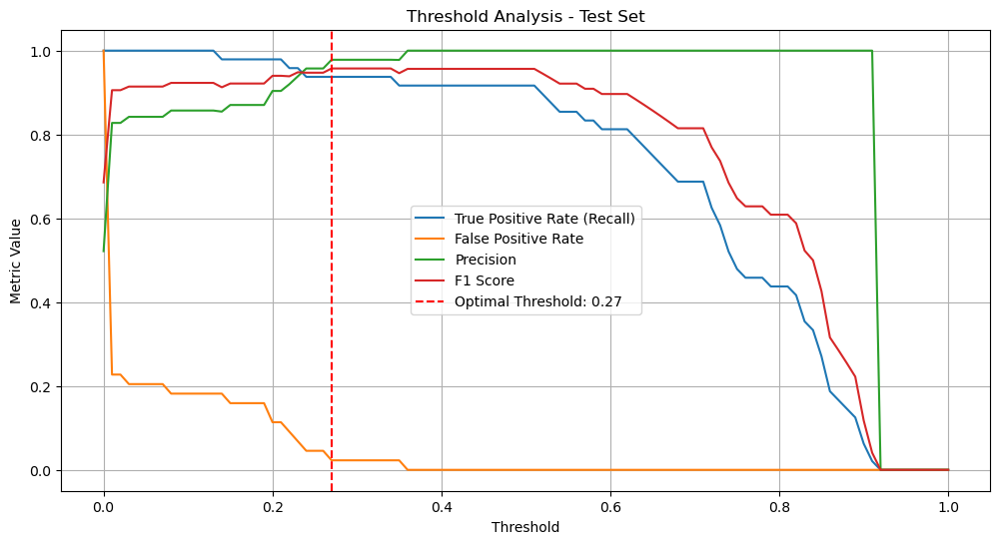

Optimal Decision Threshold (Test Set): 0.2700


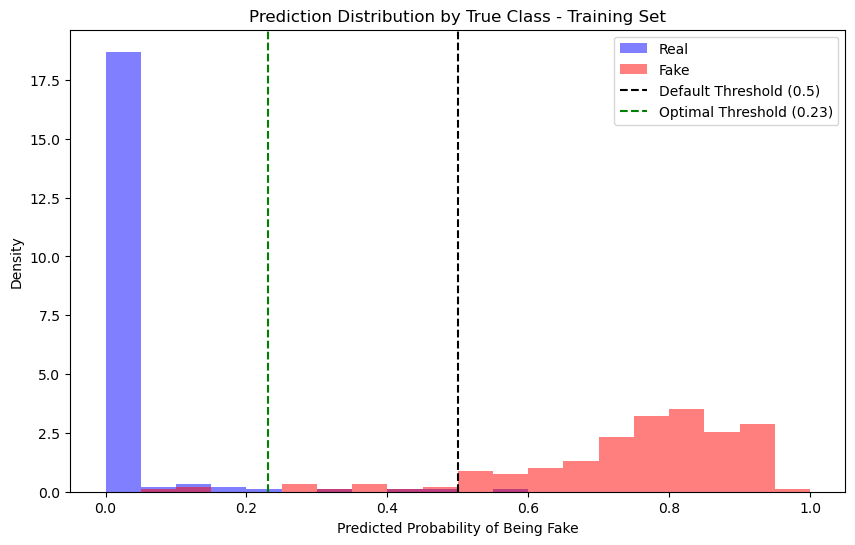

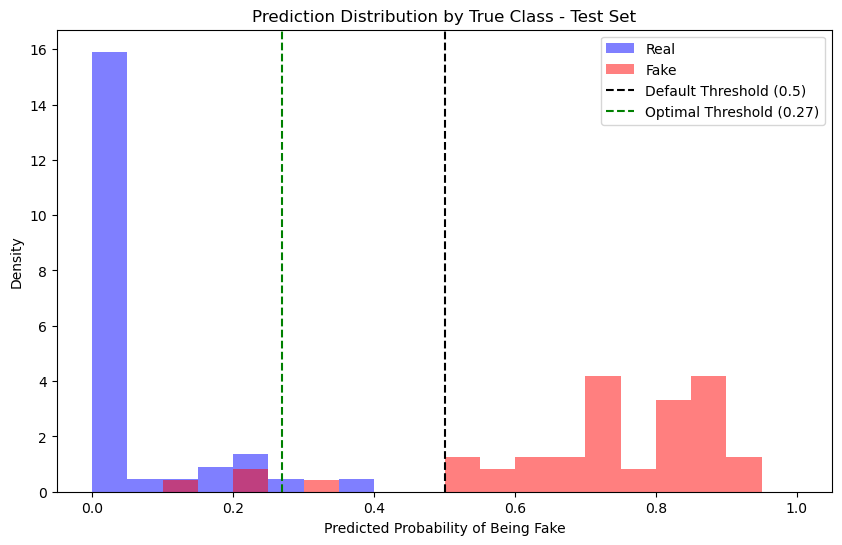


Training vs Testing Performance Comparison:


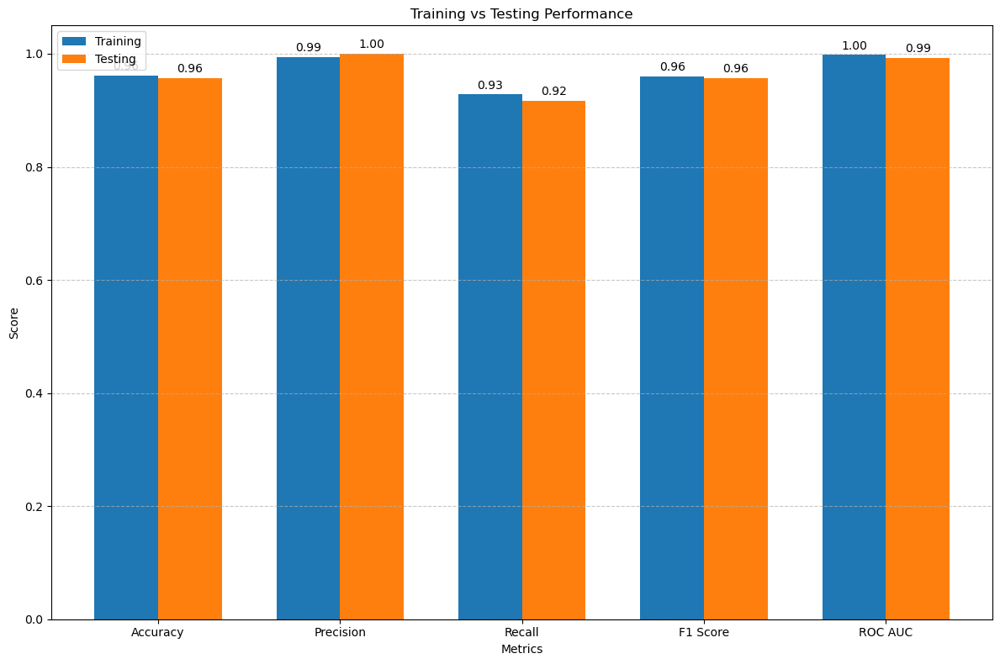

                              Metric  Training   Testing  Difference
Accuracy                    Accuracy  0.961749  0.956522   -0.005227
Balanced Accuracy  Balanced Accuracy  0.961386  0.958333   -0.003052
Precision                  Precision  0.994083  1.000000    0.005917
Recall                        Recall  0.928177  0.916667   -0.011510
F1 Score                    F1 Score  0.960000  0.956522   -0.003478
MCC                              MCC  0.925428  0.916667   -0.008762
Cohen's Kappa          Cohen's Kappa  0.923433  0.913208   -0.010226
Log Loss                    Log Loss  0.176850  0.225424    0.048574
ROC AUC                      ROC AUC  0.997790  0.992424   -0.005366
PR AUC                        PR AUC  0.997731  0.993661   -0.004069

==== MODEL ASSESSMENT SUMMARY ====
Model: MultiDomainFeatureFusionModel
Training Accuracy: 0.9617
Testing Accuracy: 0.9565
Accuracy Gap (Train-Test): 0.0052

Training F1 Score: 0.9600
Testing F1 Score: 0.9565
F1 Score Gap (Train-Test): 0.00

In [3]:
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc, precision_recall_curve, average_precision_score
from sklearn.metrics import f1_score, accuracy_score, precision_score, recall_score, matthews_corrcoef, cohen_kappa_score, log_loss, balanced_accuracy_score
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import torch
import torch.nn.functional as F
from tqdm import tqdm

# Load the saved model
model_path = 'real_fake_fusion_model.pth'
model = MultiDomainFeatureFusionModel().to(device)
model.load_state_dict(torch.load(model_path))
model.eval()

# Function to get all predictions and true labels
def get_all_predictions(model, loader):
    all_preds = []
    all_probs = []
    all_labels = []
    all_inputs = []
    
    with torch.no_grad():
        for inputs, labels in tqdm(loader, desc='Evaluating'):
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            
            # Get probabilities and predictions
            probs = F.softmax(outputs, dim=1)
            _, preds = torch.max(outputs, 1)
            
            all_inputs.append(inputs.cpu())
            all_probs.append(probs.cpu())
            all_preds.append(preds.cpu())
            all_labels.append(labels.cpu())
    
    return torch.cat(all_inputs), torch.cat(all_preds), torch.cat(all_probs), torch.cat(all_labels)

# Get predictions for both datasets
print("Evaluating train dataset:")
train_inputs, train_preds, train_probs, train_labels = get_all_predictions(model, train_loader)
print("Evaluating test dataset:")
test_inputs, test_preds, test_probs, test_labels = get_all_predictions(model, test_loader)

# Convert to numpy for both datasets
train_y_true = train_labels.numpy()
train_y_pred = train_preds.numpy()
train_y_probs = train_probs.numpy()[:, 1]  # Probability of class 1 (fake)

test_y_true = test_labels.numpy()
test_y_pred = test_preds.numpy()
test_y_probs = test_probs.numpy()[:, 1]  # Probability of class 1 (fake)

# 1. Classification Report for both datasets
print("\nClassification Report (Training Set):")
print(classification_report(train_y_true, train_y_pred, target_names=['Real', 'Fake']))

print("\nClassification Report (Test Set):")
print(classification_report(test_y_true, test_y_pred, target_names=['Real', 'Fake']))

# 2. Confusion Matrix using matplotlib instead of seaborn
def plot_confusion_matrix(y_true, y_pred, dataset_name):
    cm = confusion_matrix(y_true, y_pred)
    
    plt.figure(figsize=(8, 6))
    plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
    plt.title(f'Confusion Matrix - {dataset_name}')
    plt.colorbar()
    
    classes = ['Real', 'Fake']
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes)
    plt.yticks(tick_marks, classes)
    
    # Add text annotations
    thresh = cm.max() / 2.
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            plt.text(j, i, format(cm[i, j], 'd'),
                    horizontalalignment="center",
                    color="white" if cm[i, j] > thresh else "black")
    
    plt.xlabel('Predicted label')
    plt.ylabel('True label')
    plt.tight_layout()
    plt.show()

plot_confusion_matrix(train_y_true, train_y_pred, "Training Set")
plot_confusion_matrix(test_y_true, test_y_pred, "Test Set")

# 3. ROC Curve and AUC for both datasets
def plot_roc_curve(y_true, y_probs, dataset_name):
    fpr, tpr, _ = roc_curve(y_true, y_probs)
    roc_auc = auc(fpr, tpr)
    
    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, color='darkorange', lw=2, 
             label=f'ROC curve (AUC = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'Receiver Operating Characteristic - {dataset_name}')
    plt.legend(loc="lower right")
    plt.show()

plot_roc_curve(train_y_true, train_y_probs, "Training Set")
plot_roc_curve(test_y_true, test_y_probs, "Test Set")

# 4. Precision-Recall Curve for both datasets
def plot_precision_recall(y_true, y_probs, dataset_name):
    precision, recall, _ = precision_recall_curve(y_true, y_probs)
    avg_precision = average_precision_score(y_true, y_probs)
    
    plt.figure(figsize=(8, 6))
    plt.plot(recall, precision, color='blue', lw=2,
             label=f'Precision-Recall (AP = {avg_precision:.2f})')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title(f'Precision-Recall Curve - {dataset_name}')
    plt.legend(loc="upper right")
    plt.show()

plot_precision_recall(train_y_true, train_y_probs, "Training Set")
plot_precision_recall(test_y_true, test_y_probs, "Test Set")

# 5. Advanced Metrics Table for both datasets
def calculate_advanced_metrics(y_true, y_pred, y_probs):
    # Calculate ROC curve values for AUC
    fpr, tpr, _ = roc_curve(y_true, y_probs)
    roc_auc_value = auc(fpr, tpr)
    
    metrics = {
        'Accuracy': accuracy_score(y_true, y_pred),
        'Balanced Accuracy': balanced_accuracy_score(y_true, y_pred),
        'Precision': precision_score(y_true, y_pred),
        'Recall': recall_score(y_true, y_pred),
        'F1 Score': f1_score(y_true, y_pred),  # Explicitly using f1_score from sklearn.metrics
        'MCC': matthews_corrcoef(y_true, y_pred),
        "Cohen's Kappa": cohen_kappa_score(y_true, y_pred),
        'Log Loss': log_loss(y_true, y_probs),
        'ROC AUC': roc_auc_value,
        'PR AUC': average_precision_score(y_true, y_probs)
    }
    
    return pd.DataFrame.from_dict(metrics, orient='index', columns=['Value'])

train_advanced_metrics = calculate_advanced_metrics(train_y_true, train_y_pred, train_y_probs)
print("\nAdvanced Metrics (Training Set):")
print(train_advanced_metrics)

test_advanced_metrics = calculate_advanced_metrics(test_y_true, test_y_pred, test_y_probs)
print("\nAdvanced Metrics (Test Set):")
print(test_advanced_metrics)

# 6. Class-wise Metrics for both datasets
def class_wise_metrics(y_true, y_pred):
    cm = confusion_matrix(y_true, y_pred)
    tn, fp, fn, tp = cm.ravel()
    
    # Handle potential division by zero
    def safe_division(x, y):
        return x / y if y != 0 else 0
    
    metrics = {
        'Class': ['Real', 'Fake'],
        'TP': [tn, tp],  # For Real, TN is like TP
        'FP': [fp, fn],  # For Real, FP is like FN
        'TN': [tp, tn],  # For Real, TP is like TN
        'FN': [fn, fp],  # For Real, FN is like FP
        'Sensitivity': [safe_division(tn, (tn+fp)), safe_division(tp, (tp+fn))],
        'Specificity': [safe_division(tp, (tp+fn)), safe_division(tn, (tn+fp))],
        'PPV': [safe_division(tn, (tn+fn)), safe_division(tp, (tp+fp))],
        'NPV': [safe_division(tp, (tp+fn)), safe_division(tn, (tn+fp))]
    }
    
    return pd.DataFrame(metrics)

train_class_metrics = class_wise_metrics(train_y_true, train_y_pred)
print("\nClass-wise Metrics (Training Set):")
print(train_class_metrics)

test_class_metrics = class_wise_metrics(test_y_true, test_y_pred)
print("\nClass-wise Metrics (Test Set):")
print(test_class_metrics)

# 7. Error Analysis for both datasets
def analyze_errors(model, inputs, preds, labels, dataset_name, num_samples=5):
    # Find misclassified samples
    incorrect_mask = ~preds.eq(labels)
    incorrect_indices = torch.where(incorrect_mask)[0]
    
    if len(incorrect_indices) == 0:
        print(f"No misclassifications found in the {dataset_name}")
        return
    
    # Limit to the requested number of samples
    sample_count = min(num_samples, len(incorrect_indices))
    selected_indices = incorrect_indices[:sample_count]
    
    # Visualize errors
    plt.figure(figsize=(15, 3))
    for i, idx in enumerate(selected_indices):
        plt.subplot(1, sample_count, i+1)
        plt.imshow(inputs[idx].permute(1, 2, 0))
        plt.title(f"True: {'Fake' if labels[idx] else 'Real'}\n"
                 f"Pred: {'Fake' if preds[idx] else 'Real'}")
        plt.axis('off')
    plt.suptitle(f"Error Analysis - {dataset_name}")
    plt.tight_layout()
    plt.show()

print("\nError Analysis (Training Set):")
analyze_errors(model, train_inputs, train_preds, train_labels, "Training Set")

print("\nError Analysis (Test Set):")
analyze_errors(model, test_inputs, test_preds, test_labels, "Test Set")

# 8. Threshold Analysis for both datasets
def threshold_analysis(y_true, y_probs, dataset_name):
    thresholds = np.linspace(0, 1, 101)
    metrics = []
    
    for thresh in thresholds:
        y_pred_thresh = (y_probs >= thresh).astype(int)
        
        # Calculate confusion matrix
        cm = confusion_matrix(y_true, y_pred_thresh)
        tn, fp, fn, tp = cm.ravel()
        
        # Handle division by zero
        precision = tp / (tp + fp) if (tp + fp) > 0 else 0
        tpr = tp / (tp + fn) if (tp + fn) > 0 else 0
        fpr = fp / (fp + tn) if (fp + tn) > 0 else 0
        
        # Calculate F1 score explicitly to avoid potential issues
        f1 = 2 * (precision * tpr) / (precision + tpr) if (precision + tpr) > 0 else 0
        
        metrics.append({
            'Threshold': thresh,
            'TPR': tpr,
            'FPR': fpr,
            'Precision': precision,
            'F1': f1
        })
    
    df = pd.DataFrame(metrics)
    
    # Plot metrics vs threshold
    plt.figure(figsize=(12, 6))
    plt.plot(df['Threshold'], df['TPR'], label='True Positive Rate (Recall)')
    plt.plot(df['Threshold'], df['FPR'], label='False Positive Rate')
    plt.plot(df['Threshold'], df['Precision'], label='Precision')
    plt.plot(df['Threshold'], df['F1'], label='F1 Score')
    
    # Find optimal threshold (max F1)
    if df['F1'].max() > 0:
        optimal_idx = df['F1'].idxmax()
        optimal_thresh = df.loc[optimal_idx, 'Threshold']
        plt.axvline(x=optimal_thresh, color='r', linestyle='--', 
                    label=f'Optimal Threshold: {optimal_thresh:.2f}')
    
    plt.xlabel('Threshold')
    plt.ylabel('Metric Value')
    plt.title(f'Threshold Analysis - {dataset_name}')
    plt.legend()
    plt.grid()
    plt.show()
    
    optimal_threshold = df.loc[df['F1'].idxmax(), 'Threshold'] if df['F1'].max() > 0 else 0.5
    return optimal_threshold

print("\nThreshold Analysis (Training Set):")
train_optimal_threshold = threshold_analysis(train_y_true, train_y_probs, "Training Set")
print(f"Optimal Decision Threshold (Training Set): {train_optimal_threshold:.4f}")

print("\nThreshold Analysis (Test Set):")
test_optimal_threshold = threshold_analysis(test_y_true, test_y_probs, "Test Set")
print(f"Optimal Decision Threshold (Test Set): {test_optimal_threshold:.4f}")

# 9. Prediction Distribution for both datasets
def plot_prediction_distribution(y_true, y_probs, optimal_threshold, dataset_name):
    plt.figure(figsize=(10, 6))
    
    # Create bins for histograms
    bins = np.linspace(0, 1, 21)
    
    # Plot histograms for each class
    real_probs = y_probs[y_true == 0]
    fake_probs = y_probs[y_true == 1]
    
    if len(real_probs) > 0:
        plt.hist(real_probs, bins=bins, alpha=0.5, color='blue', 
                 label='Real', density=True)
    
    if len(fake_probs) > 0:
        plt.hist(fake_probs, bins=bins, alpha=0.5, color='red', 
                 label='Fake', density=True)
    
    plt.axvline(x=0.5, color='black', linestyle='--', label='Default Threshold (0.5)')
    plt.axvline(x=optimal_threshold, color='green', linestyle='--', 
                label=f'Optimal Threshold ({optimal_threshold:.2f})')
    
    plt.xlabel('Predicted Probability of Being Fake')
    plt.ylabel('Density')
    plt.title(f'Prediction Distribution by True Class - {dataset_name}')
    plt.legend()
    plt.show()

plot_prediction_distribution(train_y_true, train_y_probs, train_optimal_threshold, "Training Set")
plot_prediction_distribution(test_y_true, test_y_probs, test_optimal_threshold, "Test Set")

# 10. Compare Training vs Testing Performance
def compare_datasets_performance():
    # Create comparison DataFrame
    comparison = pd.DataFrame({
        'Metric': train_advanced_metrics.index,
        'Training': train_advanced_metrics['Value'],
        'Testing': test_advanced_metrics['Value'],
        'Difference': test_advanced_metrics['Value'] - train_advanced_metrics['Value']
    })
    
    # Plot comparison
    plt.figure(figsize=(12, 8))
    
    metrics_to_plot = ['Accuracy', 'Precision', 'Recall', 'F1 Score', 'ROC AUC']
    comparison_subset = comparison[comparison['Metric'].isin(metrics_to_plot)]
    
    x = np.arange(len(metrics_to_plot))
    width = 0.35
    
    plt.bar(x - width/2, comparison_subset['Training'], width, label='Training')
    plt.bar(x + width/2, comparison_subset['Testing'], width, label='Testing')
    
    plt.xlabel('Metrics')
    plt.ylabel('Score')
    plt.title('Training vs Testing Performance')
    plt.xticks(x, metrics_to_plot)
    plt.legend()
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    
    # Add value labels
    for i, v in enumerate(comparison_subset['Training']):
        plt.text(i - width/2, v + 0.01, f'{v:.2f}', ha='center')
    
    for i, v in enumerate(comparison_subset['Testing']):
        plt.text(i + width/2, v + 0.01, f'{v:.2f}', ha='center')
    
    plt.tight_layout()
    plt.show()
    
    return comparison

print("\nTraining vs Testing Performance Comparison:")
performance_comparison = compare_datasets_performance()
print(performance_comparison)

# 11. Overall Model Assessment Summary
def print_model_assessment_summary():
    print("\n==== MODEL ASSESSMENT SUMMARY ====")
    
    # Calculate overfitting metrics
    accuracy_diff = train_advanced_metrics.loc['Accuracy', 'Value'] - test_advanced_metrics.loc['Accuracy', 'Value']
    f1_diff = train_advanced_metrics.loc['F1 Score', 'Value'] - test_advanced_metrics.loc['F1 Score', 'Value']
    
    print(f"Model: MultiDomainFeatureFusionModel")
    print(f"Training Accuracy: {train_advanced_metrics.loc['Accuracy', 'Value']:.4f}")
    print(f"Testing Accuracy: {test_advanced_metrics.loc['Accuracy', 'Value']:.4f}")
    print(f"Accuracy Gap (Train-Test): {accuracy_diff:.4f}")
    
    print(f"\nTraining F1 Score: {train_advanced_metrics.loc['F1 Score', 'Value']:.4f}")
    print(f"Testing F1 Score: {test_advanced_metrics.loc['F1 Score', 'Value']:.4f}")
    print(f"F1 Score Gap (Train-Test): {f1_diff:.4f}")
    
    # Assess overfitting
    if accuracy_diff > 0.05:
        print("\nPotential overfitting detected: The model performs significantly better on training data than test data.")
        print("Consider regularization techniques or collecting more diverse training data.")
    else:
        print("\nNo significant overfitting detected: Model performs similarly on training and test data.")
    
    # Assess model quality based on test metrics
    test_f1 = test_advanced_metrics.loc['F1 Score', 'Value']
    if test_f1 > 0.9:
        model_quality = "Excellent"
    elif test_f1 > 0.8:
        model_quality = "Good"
    elif test_f1 > 0.7:
        model_quality = "Fair"
    else:
        model_quality = "Needs improvement"
    
    print(f"\nOverall Model Quality: {model_quality}")
    print(f"Optimal Threshold (based on F1): {test_optimal_threshold:.4f}")
    
    # Class-specific assessment
    real_sensitivity = test_class_metrics.loc[0, 'Sensitivity']
    fake_sensitivity = test_class_metrics.loc[1, 'Sensitivity']
    
    print(f"\nReal Image Detection Sensitivity: {real_sensitivity:.4f}")
    print(f"Fake Image Detection Sensitivity: {fake_sensitivity:.4f}")
    
    if abs(real_sensitivity - fake_sensitivity) > 0.1:
        imbalance_class = "Real" if real_sensitivity > fake_sensitivity else "Fake"
        print(f"Class imbalance detected: Model performs better on '{imbalance_class}' class.")
        print("Consider balanced training techniques or adjusting the decision threshold.")

print_model_assessment_summary()